# Use pretrained model to perform speech recognition and translation.


## Overview

The process of speech recognition looks like the following.

1. Extract the acoustic features from audio waveform

2. Estimate the class of the acoustic features frame-by-frame

3. Generate hypothesis from the sequence of the class probabilities

Torchaudio provides easy access to the pre-trained weights and
associated information, such as the expected sample rate and class
labels. They are bundled together and available under `torchaudio.pipelines` module.




In [ ]:
#
import torch
import torchaudio
from torchaudio.utils import download_asset
import IPython
import matplotlib.pyplot as plt

print(torch.__version__)
print(torchaudio.__version__)

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

2.3.0+cu121
2.3.0+cu121
cuda


## Creating a pipeline

First, we will create a Wav2Vec2 model that performs the feature
extraction and the classification.

There are two types of Wav2Vec2 pre-trained weights available in
torchaudio. The ones fine-tuned for ASR task, and the ones not
fine-tuned.

Wav2Vec2 (and HuBERT) models are trained in self-supervised manner. They
are firstly trained with audio only for representation learning, then
fine-tuned for a specific task with additional labels.

The pre-trained weights without fine-tuning can be fine-tuned
for other downstream tasks as well.

We will use `torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H` here. [Documentation](https://pytorch.org/audio/stable/pipelines)

The bundle object provides the interface to instantiate model and other
information. Sampling rate and the class labels are found as follow.




In [ ]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_LARGE_960H

print("Sample Rate:", bundle.sample_rate)

print("Labels:", bundle.get_labels())

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [ ]:
model_asr = bundle.get_model().to(device)

print(model_asr.__class__)

Downloading: "https://download.pytorch.org/torchaudio/models/wav2vec2_fairseq_large_ls960_asr_ls960.pth" to /root/.cache/torch/hub/checkpoints/wav2vec2_fairseq_large_ls960_asr_ls960.pth
100%|██████████| 1.18G/1.18G [00:20<00:00, 61.0MB/s]


<class 'torchaudio.models.wav2vec2.model.Wav2Vec2Model'>


## Load data

To load data, we use :py:func:`torchaudio.load`.

If the sampling rate is different from what the pipeline expects, then
we can use `torchaudio.functional.resample` for resampling.


In [ ]:
speech_file = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")

waveform, sample_rate = torchaudio.load(speech_file)
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

100%|██████████| 106k/106k [00:00<00:00, 3.54MB/s]


In [ ]:
IPython.display.Audio(speech_file)
print(waveform.shape)

torch.Size([1, 54400])


## Extracting acoustic features

The next step is to extract acoustic features from the audio.
Wav2Vec2 models fine-tuned for ASR task can perform feature
   extraction and classification with one step, but for the sake of the
   tutorial, we also show how to perform feature extraction here.




In [ ]:
with torch.inference_mode():
    features, _ = model_asr.extract_features(waveform)

The returned features is a list of tensors. Each tensor is the output of
a transformer layer.




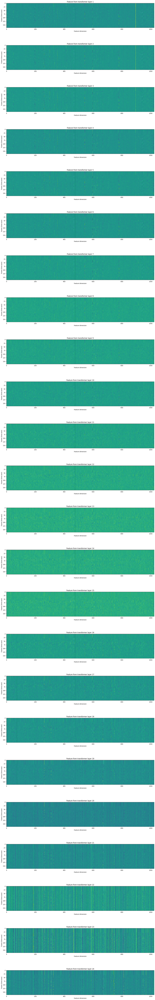

In [ ]:
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")
fig.tight_layout()

## Feature classification

Once the acoustic features are extracted, the next step is to classify
them into a set of categories.

Wav2Vec2 model provides method to perform the feature extraction and
classification in one step.




In [ ]:
with torch.inference_mode():
    emission, _ = model_asr(waveform)

The output is in the form of logits. It is not in the form of
probability.

Let’s visualize this.




Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


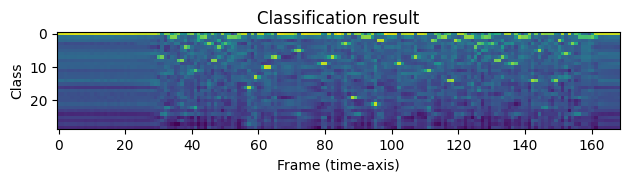

In [ ]:
plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.tight_layout()
print("Class labels:", bundle.get_labels())

## Generating transcripts

From the sequence of label probabilities, now we want to generate
transcripts. The process to generate hypotheses is often called
“decoding”.

Decoding is more elaborate than simple classification because
decoding at certain time step can be affected by surrounding
observations.

For example, take a word like ``night`` and ``knight``. Even if their
prior probability distribution are differnt (in typical conversations,
``night`` would occur way more often than ``knight``), to accurately
generate transcripts with ``knight``, such as ``a knight with a sword``,
the decoding process has to postpone the final decision until it sees
enough context.

There are many decoding techniques proposed, and they require external
resources, such as word dictionary and language models.

In this tutorial, for the sake of simplicity, we will perform greedy
decoding which does not depend on such external components, and simply
pick up the best hypothesis at each time step. Therefore, the context
information are not used, and only one transcript can be generated.

We start by defining greedy decoding algorithm.




In [ ]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return "".join([self.labels[i] for i in indices])

Now create the decoder object and decode the transcript.




In [ ]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])
transcript = transcript.replace("|", " ").lower()
print(transcript)

i had that curiosity beside me at this moment 


## Translate this message into another language

First, let us install the transformers library and its dependencies for language translation.

In [ ]:
!pip install transformers -q

Next, importing the pipeline function from the transformers library,

In [ ]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM, pipeline


The pipeline method is responsible for:

  - Pre-processing: Converting raw text input to numerical input for a given pre-trained model
  - Model Inference: Making a prediction using a pre-trained model
  - Post-processing: Converting prediction to a proper output

  For the language codes, please refer to this [page](https://github.com/facebookresearch/flores/blob/main/nllb_seed/README.md).

In [ ]:
model = AutoModelForSeq2SeqLM.from_pretrained('facebook/nllb-200-distilled-600M')
tokenizer = AutoTokenizer.from_pretrained('facebook/nllb-200-distilled-600M')


# Creating a Text2TextGenerationPipeline for language translation
source_lang = 'eng_Latn'
target_lang = 'fra_Latn'
translator_en_fr = pipeline(task='translation', model=model, tokenizer=tokenizer, src_lang=source_lang, tgt_lang=target_lang)

source_lang = 'eng_Latn'
target_lang = 'zho_Hans'
translator_en_zh = pipeline(task='translation', model=model, tokenizer=tokenizer, src_lang=source_lang, tgt_lang=target_lang)

source_lang = 'eng_Latn'
target_lang = 'tha_Thai'
translator_en_th = pipeline(task='translation', model=model, tokenizer=tokenizer, src_lang=source_lang, tgt_lang=target_lang)


In [ ]:
# Converting
french_text = translator_en_fr("That is a flower")
chinese_text = translator_en_zh("That is a flower")
thai_text = translator_en_th("That is a flower")

print(french_text[0]['translation_text'])
print(chinese_text[0]['translation_text'])
print(thai_text[0]['translation_text'])

C' est une fleur.
这是一个花
นั่นเป็นดอกไม้


Now let's try to translate our speech signal.

In [ ]:
french_text = translator_en_fr(transcript)
chinese_text = translator_en_zh(transcript)
thai_text = translator_en_th(transcript)

print(french_text[0]['translation_text'])
print(chinese_text[0]['translation_text'])
print(thai_text[0]['translation_text'])

J' avais cette curiosité à mes côtés en ce moment .
我当时有那个好奇心.
ฉันมีความอยากรู้อยู่ข้างๆฉันในขณะนี้
